In [ ]:
cd /content/drive/MyDrive/XAI

/content/drive/MyDrive/XAI


In [ ]:
!pip install lime
!pip install shap
!pip install alibi

# Functions Binary

In [29]:
#shape model function
import pandas as pd
def print_df(df):
  total_rows = df.shape[0]
  dataframe_info = df.info()
  dataframe_description = df.describe()
  print(total_rows)
  print(dataframe_info)
  print(df.head())
  print(dataframe_description)

### Shap
import shap
def explain_prediction(instance_idx, explainer, shap_values, feature_names):
    """
    Function to generate a textual explanation for a single instance.
    Args:
    - instance_idx: Index of the instance to explain.
    - explainer: The SHAP explainer object.
    - shap_values: SHAP values for the dataset.
    - feature_names: List of feature names.

    Returns:
    - A string explaining the instance's prediction.
    """
    # Get the SHAP values for the specified instance
    shap_value_for_instance = shap_values[instance_idx]
    feature_values = X_test.iloc[instance_idx]  # Feature values for the instance

    # Generate explanation text
    explanation = []
    for i in range(len(shap_value_for_instance)):
        feature_name = feature_names[i]
        feature_value = feature_values[i]
        shap_value = shap_value_for_instance[i]

        # Formulate explanation based on SHAP value
        if shap_value > 0:
            explanation.append(f"{feature_name} (value = {feature_value}) increases the probability of COVID by {shap_value:.3f}")
        else:
            explanation.append(f"{feature_name} (value = {feature_value}) decreases the probability of COVID by {abs(shap_value):.3f}")

    # Combine into one explanation string
    return "\n".join(explanation)

def shap_model(model,X_test, sample_number):

  shap.initjs()
  explainer = shap.TreeExplainer(model)

  # Get SHAP values for the test dataset
  shap_values = explainer.shap_values(X_test )

  # Check the shape of shap_values (as done earlier)
  print(f"Shape of shap_values: {len(shap_values)}, {shap_values[0].shape}")

  # Extract SHAP values for the positive class (COVID-19, class 1)
  shap_values_for_plot = shap_values[..., 1]

  # Summary plot for SHAP values
  shap.summary_plot(shap_values_for_plot, X_test, feature_names=X.columns)

  # Force plot for an individual prediction (e.g., first instance in X_test)
  shap.force_plot(explainer.expected_value[1], shap_values_for_plot[0], X_test.iloc[0], feature_names=X.columns)

  shap.force_plot(explainer.expected_value[1], shap_values_for_plot[0], X_test.iloc[0], feature_names=X.columns, matplotlib=True)

  # Example usage
  instance_idx = sample_number  # Specify the instance you want to explain
  feature_names = X_test.columns
  textual_explanation = explain_prediction(instance_idx, explainer, shap_values_for_plot, feature_names)
  print(textual_explanation)

### Lime
import lime
import lime.lime_tabular

# Function to generate a textual explanation for LIME
def explain_with_lime(instance_idx, explainer, X_test, model, feature_names):
    """
    Function to generate a textual explanation for a single instance using LIME.
    Args:
    - instance_idx: Index of the instance to explain.
    - explainer: LIME explainer object.
    - X_test: Test dataset (features).
    - model: The trained model to explain.
    - feature_names: List of feature names.

    Returns:
    - A string explaining the instance's prediction.
    """
    # Get the instance to explain
    instance = X_test.iloc[instance_idx].values

    # Explain the instance using LIME
    lime_exp = explainer.explain_instance(instance, model.predict_proba, num_features=len(feature_names))

    # Generate explanation text
    explanation = []

    for feature, impact in lime_exp.as_list():
        # If impact is positive, feature increases the probability of the class
        if impact > 0:
            explanation.append(f"{feature} increases the probability by {impact:.3f}")
        else:
            explanation.append(f"{feature} decreases the probability by {abs(impact):.3f}")

    # Combine into one explanation string
    return "\n".join(explanation)

def lime_model(model,X_test, X_train, sample_number, positive, negative):
  # Create LIME explainer for tabular data
  lime_explainer = lime.lime_tabular.LimeTabularExplainer(
      X_train.values,
      feature_names=X_test.columns,
      class_names=[negative, positive],
      discretize_continuous=True
  )
  # Generate a textual explanation for a specific instance
  instance_idx = sample_number  # Specify the instance to explain
  feature_names = X_test.columns
  lime_textual_explanation = explain_with_lime(instance_idx, lime_explainer, X_test, model, feature_names)
  print(lime_textual_explanation)

  # You can also display the LIME explanation in a more visual way:
  lime_explanation = lime_explainer.explain_instance(X_test.iloc[instance_idx].values, model.predict_proba)
  lime_explanation.show_in_notebook(show_table=True)



###Anchor
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='sklearn')
# Import necessary libraries
from alibi.explainers import AnchorTabular

# Function to generate a textual explanation using Anchor
def explain_with_anchor(instance_idx, explainer, X_test, feature_names):
    """
    Function to generate a textual explanation for a single instance using Anchor.
    Args:
    - instance_idx: Index of the instance to explain.
    - explainer: Anchor explainer object.
    - X_test: Test dataset (features).
    - feature_names: List of feature names.

    Returns:
    - A string explaining the instance's prediction using Anchor rules.
    """
    # Get the instance to explain
    instance = X_test.iloc[instance_idx].values

    # Explain the instance using the Anchor explainer
    #explanation = explainer.explain(X_test.iloc[instance_idx])
    explanation = explainer.explain(instance)

    # Generate explanation text
    explanation_text = []

    explanation_text.append("Anchor Explanation for the Prediction:")
    explanation_text.append("IF the following conditions hold:")

    for anchor in explanation.anchor:
        explanation_text.append(f"- {anchor}")

    # Extract the prediction (predicted label)
    predicted_label = explanation.data['precision']  # Example of accessing precision

    # Generate the final explanation
    explanation_text.append(f"THEN the model predicts: Class {predicted_label} with precision: {explanation.precision:.2f}")

    # Combine into one explanation string
    return "\n".join(explanation_text)

def anchor_model(model,X_test, X_train, sample_number):
  # Generate a textual explanation for a specific instance
  instance_idx = 0  # Specify the instance to explain
  # Anchor explanation starts here
  # Use predict_proba since Anchor expects probabilities, not class labels
  predict_fn = lambda x: model.predict_proba(x)
  # Create an Anchor explainer, now passing feature_names in the initialization
  anchor_explainer = AnchorTabular(predict_fn, feature_names=X_train.columns.tolist())
  # Fit the explainer to the training data
  anchor_explainer.fit(X_train.values)
  feature_names = X_test.columns
  anchor_textual_explanation = explain_with_anchor(instance_idx, anchor_explainer, X_test, feature_names)
  print(anchor_textual_explanation)

# Functons Multi

In [25]:
import shap
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='sklearn')
from alibi.explainers import AnchorTabular

def shape_explain_prediction_multi(instance_idx, explainer, shap_values, feature_names, class_names):
    """
    Function to generate a textual explanation for a single instance in multi-class classification.
    Args:
    - instance_idx: Index of the instance to explain.
    - explainer: The SHAP explainer object.
    - shap_values: SHAP values for the dataset.
    - feature_names: List of feature names.
    - class_names: List of class labels.

    Returns:
    - A string explaining the instance's prediction.
    """
    explanation = []
    for class_idx, class_name in enumerate(class_names):
        shap_value_for_instance = shap_values[class_idx][instance_idx]
        feature_values = X_test.iloc[instance_idx]  # Feature values for the instance
        explanation.append(f"Explanation for class: {class_name}")

        for i in range(len(shap_value_for_instance)):
            feature_name = feature_names[i]
            feature_value = feature_values[i]
            shap_value = shap_value_for_instance[i]

            # Formulate explanation based on SHAP value for this class
            if shap_value > 0:
                explanation.append(f"{feature_name} (value = {feature_value}) increases the probability of {class_name} by {shap_value:.3f}")
            else:
                explanation.append(f"{feature_name} (value = {feature_value}) decreases the probability of {class_name} by {abs(shap_value):.3f}")
        explanation.append("\n")

    return "\n".join(explanation)

def shap_model_multi(model, X_test, sample_number, class_names):

    shap.initjs()
    explainer = shap.TreeExplainer(model)

    # Get SHAP values for the test dataset
    shap_values = explainer.shap_values(X_test)

    # Check the shape of shap_values (for each class)
    for class_idx, class_name in enumerate(class_names):
        print(f"SHAP values for class {class_name}: {shap_values[class_idx].shape}")

    # Fix: Correctly pass the SHAP values for each class
    for class_idx, class_name in enumerate(class_names):
        print(f"Summary plot for class {class_name}")

        # shap_values[class_idx] is expected to have the shape (number of samples, number of features)
        if shap_values[class_idx].shape[1] == X_test.shape[1]:
            shap.summary_plot(shap_values[class_idx], X_test, feature_names=X_test.columns)
        else:
            print(f"Skipping class {class_name} due to shape mismatch: {shap_values[class_idx].shape} vs {X_test.shape}")

    # Example usage for explaining one instance
    instance_idx = sample_number
    feature_names = X_test.columns
    textual_explanation = shape_explain_prediction_multi(instance_idx, explainer, shap_values, feature_names, class_names)
    print(textual_explanation)


# Function to generate a textual explanation for LIME in multi-class classification
def explain_with_lime_multi(instance_idx, explainer, X_test, model, feature_names, class_names):
    """
    Function to generate a textual explanation for a single instance using LIME.
    Args:
    - instance_idx: Index of the instance to explain.
    - explainer: LIME explainer object.
    - X_test: Test dataset (features).
    - model: The trained model to explain.
    - feature_names: List of feature names.
    - class_names: List of class names (multi-class).

    Returns:
    - A string explaining the instance's prediction.
    """
    instance = X_test.iloc[instance_idx].values
    lime_exp = explainer.explain_instance(instance, model.predict_proba, num_features=len(feature_names))

    # Explanation for each class
    explanation = []
    for class_name in class_names:
        explanation.append(f"Explanation for class: {class_name}")

    for feature, impact in lime_exp.as_list():
        if impact > 0:
            explanation.append(f"{feature} increases the probability by {impact:.3f}")
        else:
            explanation.append(f"{feature} decreases the probability by {abs(impact):.3f}")

    return "\n".join(explanation)

def lime_model_multi(model, X_test, X_train, sample_number, class_names):
    # Create LIME explainer for tabular data
    lime_explainer = lime.lime_tabular.LimeTabularExplainer(
        X_train.values,
        feature_names=X_test.columns,
        class_names=class_names,
        discretize_continuous=True
    )

    # Generate a textual explanation for a specific instance
    instance_idx = sample_number
    feature_names = X_test.columns
    lime_textual_explanation = explain_with_lime_multi(instance_idx, lime_explainer, X_test, model, feature_names, class_names)
    print(lime_textual_explanation)

    # Display the LIME explanation visually
    lime_explanation = lime_explainer.explain_instance(X_test.iloc[instance_idx].values, model.predict_proba)
    lime_explanation.show_in_notebook(show_table=True)



# Function to generate a textual explanation using Anchor for multi-class classification
def explain_with_anchor_multi(instance_idx, explainer, X_test, feature_names, class_names):
    """
    Function to generate a textual explanation for a single instance using Anchor in multi-class classification.
    Args:
    - instance_idx: Index of the instance to explain.
    - explainer: Anchor explainer object.
    - X_test: Test dataset (features).
    - feature_names: List of feature names.
    - class_names: List of class names.

    Returns:
    - A string explaining the instance's prediction using Anchor rules.
    """
    instance = X_test.iloc[instance_idx].values
    explanation = explainer.explain(instance)

    # Generate explanation text
    explanation_text = []
    explanation_text.append("Anchor Explanation for the Prediction:")
    explanation_text.append("IF the following conditions hold:")

    for anchor in explanation.anchor:
        explanation_text.append(f"- {anchor}")

    # Access the predicted label from explanation.data['raw']['prediction']
    predicted_label = explanation.data['raw']['prediction'][0]  # The predicted label is an array, so take the first element
    explanation_text.append(f"THEN the model predicts: Class {class_names[predicted_label]} with precision: {explanation.precision:.2f}")

    return "\n".join(explanation_text)

def anchor_model_multi(model, X_test, X_train, sample_number, class_names):
    # Use predict_proba since Anchor expects probabilities, not class labels
    predict_fn = lambda x: model.predict_proba(x)
    anchor_explainer = AnchorTabular(predict_fn, feature_names=X_train.columns.tolist())
    anchor_explainer.fit(X_train.values)

    # Generate a textual explanation for a specific instance
    instance_idx = sample_number
    feature_names = X_test.columns
    anchor_textual_explanation = explain_with_anchor_multi(instance_idx, anchor_explainer, X_test, feature_names, class_names)
    print(anchor_textual_explanation)




# Covid

  Breathing Problem Fever Dry Cough Sore throat Running Nose Asthma  \
0               Yes   Yes       Yes         Yes          Yes     No   
1               Yes   Yes       Yes         Yes           No    Yes   
2               Yes   Yes       Yes         Yes          Yes    Yes   
3               Yes   Yes       Yes          No           No    Yes   
4               Yes   Yes       Yes         Yes          Yes     No   

  Chronic Lung Disease Headache Heart Disease Diabetes  ... Fatigue   \
0                   No       No            No      Yes  ...      Yes   
1                  Yes      Yes            No       No  ...      Yes   
2                  Yes      Yes            No      Yes  ...      Yes   
3                   No       No           Yes      Yes  ...       No   
4                  Yes      Yes           Yes      Yes  ...       No   

  Gastrointestinal  Abroad travel Contact with COVID Patient  \
0               Yes            No                        Yes   
1           

Shape of shap_values: 1087, (20, 2)


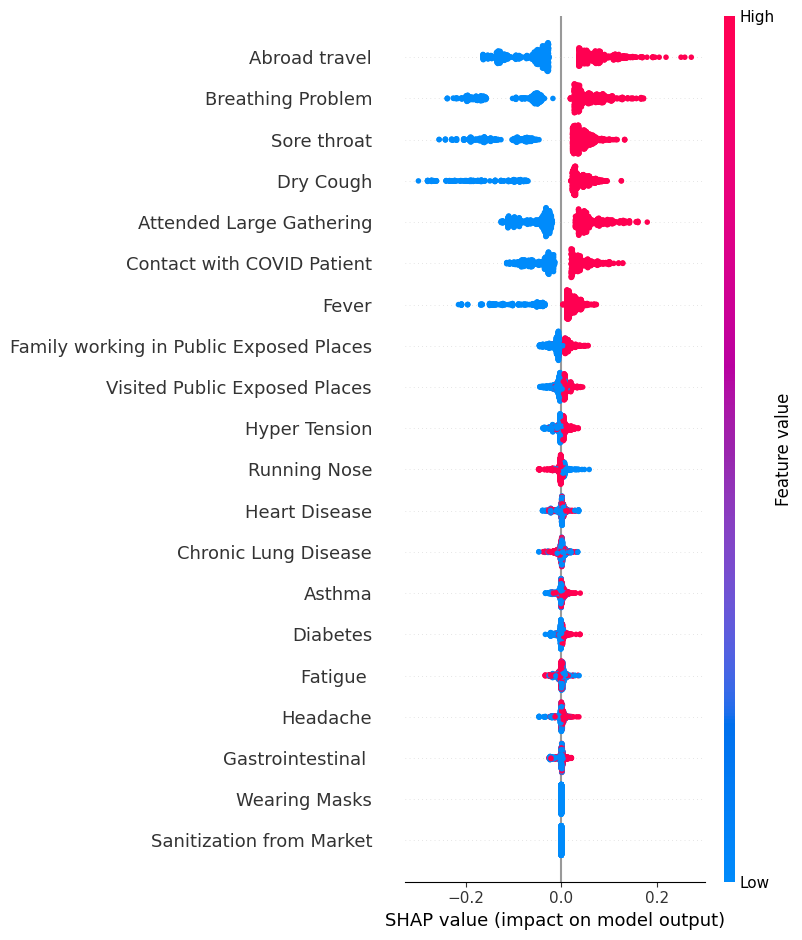

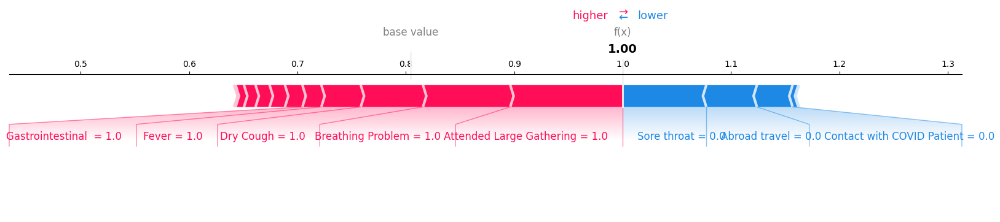

<ipython-input-6-a5c3d49f4c50>:34: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  feature_value = feature_values[i]


Breathing Problem (value = 1) increases the probability of COVID by 0.081
Fever (value = 1) increases the probability of COVID by 0.036
Dry Cough (value = 1) increases the probability of COVID by 0.057
Sore throat (value = 0) decreases the probability of COVID by 0.077
Running Nose (value = 0) increases the probability of COVID by 0.008
Asthma (value = 0) decreases the probability of COVID by 0.005
Chronic Lung Disease (value = 1) decreases the probability of COVID by 0.000
Headache (value = 0) decreases the probability of COVID by 0.000
Heart Disease (value = 1) increases the probability of COVID by 0.001
Diabetes (value = 1) increases the probability of COVID by 0.011
Hyper Tension (value = 1) increases the probability of COVID by 0.013
Fatigue  (value = 1) increases the probability of COVID by 0.014
Gastrointestinal  (value = 1) increases the probability of COVID by 0.017
Abroad travel (value = 0) decreases the probability of COVID by 0.047
Contact with COVID Patient (value = 0) dec

Anchor Explanation for the Prediction:
IF the following conditions hold:
- Attended Large Gathering > 0.00
- Breathing Problem > 0.00
THEN the model predicts: Class 1.0 with precision: 1.00


In [ ]:
# Import libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
import shap
import lime
import lime.lime_tabular
from sklearn.preprocessing import LabelEncoder

# Load dataset (adjust this if necessary)
df = pd.read_csv('/content/drive/MyDrive/XAI/Covid Dataset.csv')

# Display first few rows
print(df.head())


# Convert categorical columns to numerical
le = LabelEncoder()
for col in df.columns:
    df[col] = le.fit_transform(df[col])

# Split the dataset into features and target
X = df.drop('COVID-19', axis=1)  # Features
y = df['COVID-19']  # Target

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a RandomForest classifier
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))

sample_number =0
shap_model(model,X_test, sample_number)
lime_model(model,X_test, X_train, sample_number, 'Covid', 'Non Covid')
anchor_model(model,X_test, X_train, sample_number)

# Breast Cancer

              precision    recall  f1-score   support

           0       0.96      0.99      0.97        71
           1       0.98      0.93      0.95        43

    accuracy                           0.96       114
   macro avg       0.97      0.96      0.96       114
weighted avg       0.97      0.96      0.96       114



Shape of shap_values: 114, (30, 2)


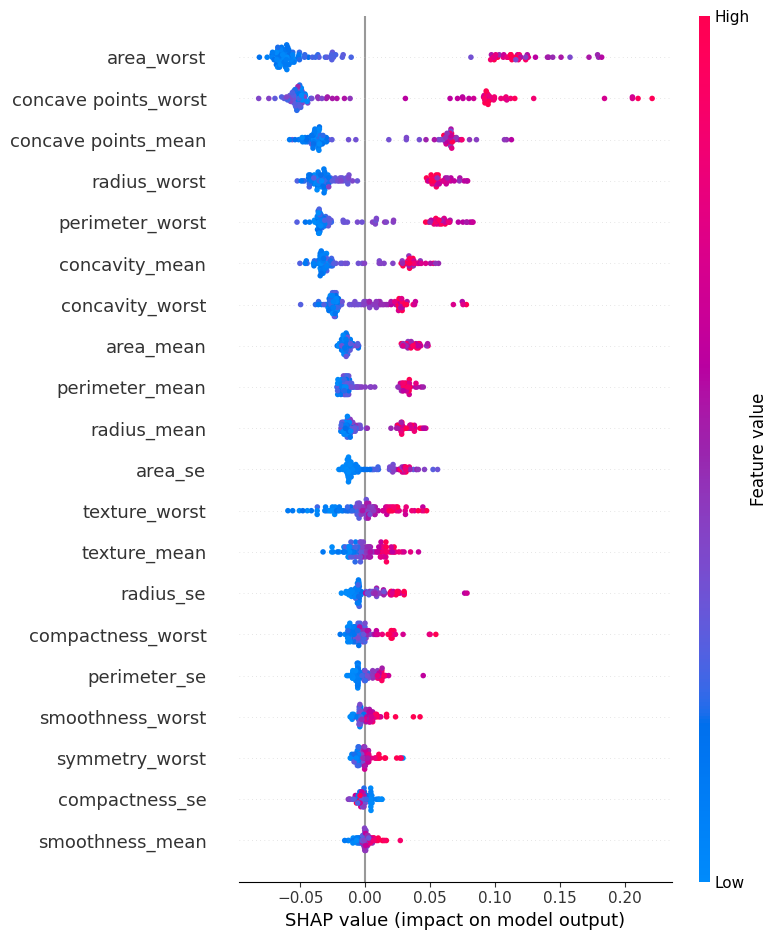

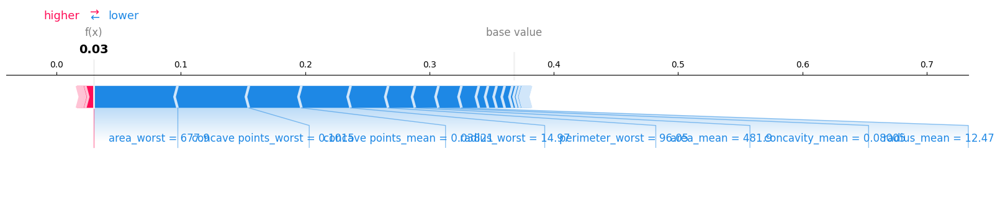

<ipython-input-6-a5c3d49f4c50>:34: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  feature_value = feature_values[i]


radius_mean (value = 12.47) decreases the probability of COVID by 0.018
texture_mean (value = 18.6) decreases the probability of COVID by 0.003
perimeter_mean (value = 81.09) decreases the probability of COVID by 0.014
area_mean (value = 481.9) decreases the probability of COVID by 0.022
smoothness_mean (value = 0.09965) decreases the probability of COVID by 0.000
compactness_mean (value = 0.1058) decreases the probability of COVID by 0.002
concavity_mean (value = 0.08005) decreases the probability of COVID by 0.019
concave points_mean (value = 0.03821) decreases the probability of COVID by 0.042
symmetry_mean (value = 0.1925) decreases the probability of COVID by 0.001
fractal_dimension_mean (value = 0.06373) decreases the probability of COVID by 0.001
radius_se (value = 0.3961) increases the probability of COVID by 0.000
texture_se (value = 1.044) decreases the probability of COVID by 0.003
perimeter_se (value = 2.497) decreases the probability of COVID by 0.000
area_se (value = 30.2

Anchor Explanation for the Prediction:
IF the following conditions hold:
- concavity_mean <= 0.13
- area_worst <= 686.60
THEN the model predicts: Class 0.9801474758933636 with precision: 0.98


In [ ]:
# Import necessary libraries
import shap
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report

# Load the breast cancer dataset (assuming 'df' is the dataframe from your description)
# You should replace this with the appropriate loading code if needed
df = pd.read_csv('/content/drive/MyDrive/XAI/breast.csv')

# Encode the 'diagnosis' column (target) as numerical values
df['diagnosis'] = LabelEncoder().fit_transform(df['diagnosis'])

# Split the data into features (X) and target (y)
X = df.drop(columns=['id', 'Unnamed: 32', 'diagnosis'])  # Remove 'id', 'Unnamed: 32', and the target 'diagnosis'
y = df['diagnosis']  # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a RandomForestClassifier
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Make predictions and evaluate the model
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))

sample_number =0
shap_model(model,X_test, sample_number)
lime_model(model,X_test, X_train, sample_number, 'Cancer', 'Non Cancer')
anchor_model(model,X_test, X_train, sample_number)

# Chagas

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Define a dictionary for renaming column names to English
column_mapping = {
    'id': 'ID',
    'sitio': 'Site',
    'elegible': 'Eligible',
    'reclut': 'Recruitment',
    'visitarec': 'Visit_of_Recruitment',
    'medad': 'Maternal_Age_at_Delivery',
    'resid': 'Residence',
    'vinch': 'Triatomines',
    'vih': 'HIV',
    'tto': 'Treatment',
    'ttodroga': 'Drug',
    'nhijos': 'Number_of_Previous_Children',
    'hijosinf': 'Infected_Children',
    'nrnvivo': 'Number_of_Newborn_Alive',
    'sexo': 'Sex',
    'rnestado': 'Newborn_Condition',
    'defcong': 'Congenital_Defects',
    'intern': 'Hospitalization',
    'sangrecordon': 'Umbilical_Cord_Blood',
    'parasitcu': 'Parasitological_on_UCB',
    'pcrcu': 'PCR_on_UCB',
    'pcrcud': 'Detailed_PCR_on_UCB',
    'tpocu': 'Time_of_UCB_Sample',
    'visita1': 'Visit_1',
    'recv1': 'Recruitment_as_Visit_1',
    'tpov1': 'Time_at_Visit_1',
    'lactv1': 'Breastfeeding_till_Visit_1',
    'grietasv1': 'Nipple_Crack_till_Visit_1',
    'muestrav1': 'Sample_at_Visit_1',
    'parasitv1': 'Parasitological_on_PVB_at_Visit_1',
    'pcrv1': 'PCR_on_PVB_at_Visit_1',
    'pcrv1d': 'Detailed_PCR_on_PVB_at_Visit_1',
    'visita2': 'Visit_2',
    'tpov2': 'Time_at_Visit_2',
    'lactv2': 'Breastfeeding_at_Visit_2',
    'transfusion': 'Transfusion',
    'transorg': 'Organ_Transplantation',
    'infv2': 'Infection_at_Visit_2',
    'ttov2': 'Treatment_at_Visit_2',
    'serhai': 'Result_of_IHA',
    'serelisa': 'Result_of_EIA',
    'hairea': 'IHA_Reactive',
    'elisarea': 'EIA_Reactive',
    'serv2': 'Final_Serology_Result',
    'pcrv2': 'PCR_on_PVB_at_Visit_2',
    'chagcong': 'Congenital_Chagas',
    'bincomp': 'Complete_Pair',
    'parcu': 'Complete_Pair_with_UCB_Sample',
    'par3': 'Complete_Pair_with_Results_Up_to_3_Days',
    'par152': 'Complete_Pair_with_Results_Up_to_152_Days'
}

# Load the dataset
file_path = '/content/drive/MyDrive/XAI/FONARSEC Study_public data base.csv'
df = pd.read_csv(file_path)

# Inspect the dataset to understand its structure
df.head()

# Dropping columns that are not necessary for prediction
df_cleaned = df.drop(columns=['ID'])  # Keep 'Congenital_Chagas' since it's the target variable

# Drop rows with missing target (Congenital_Chagas) values
df_cleaned = df_cleaned.dropna(subset=['Congenital_Chagas'])

# Fill missing values in the dataset with forward fill
df_cleaned.fillna(method='ffill', inplace=True)

# Split the data into features and target
X = df_cleaned.drop(columns=['Congenital_Chagas'])  # Features
y = df_cleaned['Congenital_Chagas']  # Target

# Convert categorical columns to numeric (if needed)
X = pd.get_dummies(X, drop_first=True)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a Random Forest Classifier
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
report = classification_report(y_test, y_pred)
print(report)


sample_number =0
shap_model(model,X_test, sample_number)
lime_model(model,X_test, X_train, sample_number, 'Chagas', 'Non Chagas')
anchor_model(model,X_test, X_train, sample_number)

# Kidney Disease

Unique values in 'classification' column after cleaning: ['ckd' 'notckd']
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        52
           1       1.00      1.00      1.00        28

    accuracy                           1.00        80
   macro avg       1.00      1.00      1.00        80
weighted avg       1.00      1.00      1.00        80



Shape of shap_values: 80, (24, 2)


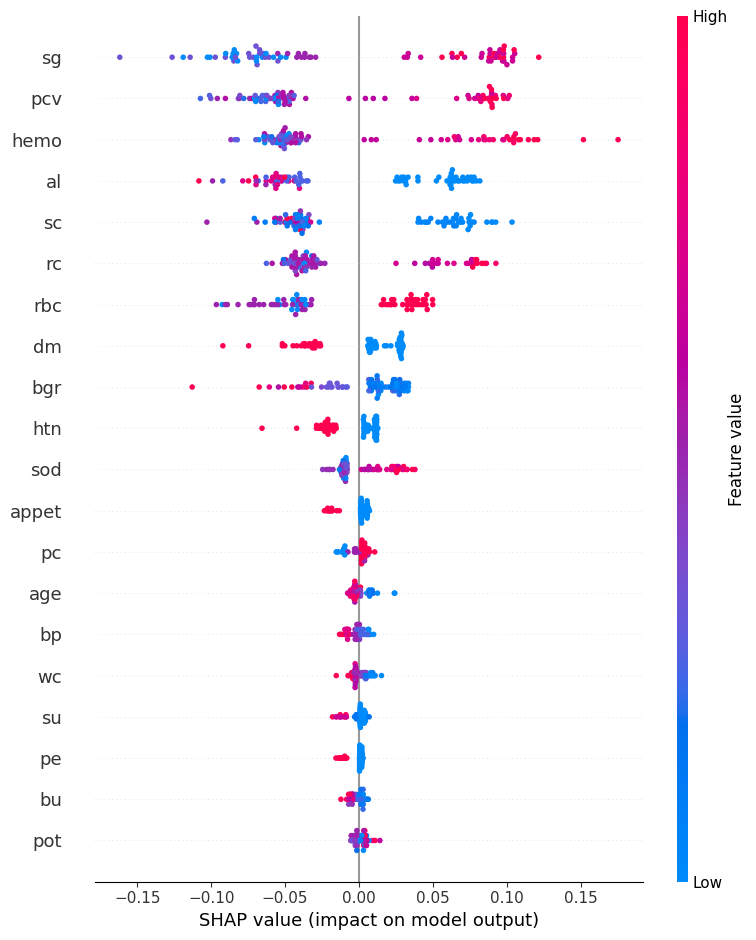

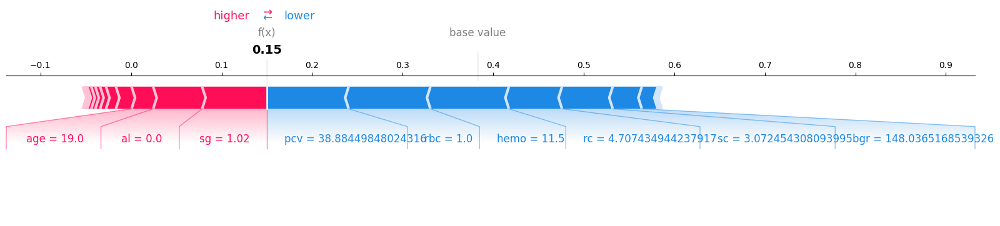

<ipython-input-29-c12328b86613>:34: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  feature_value = feature_values[i]


age (value = 19.0) increases the probability of COVID by 0.024
bp (value = 70.0) increases the probability of COVID by 0.004
sg (value = 1.02) increases the probability of COVID by 0.071
al (value = 0.0) increases the probability of COVID by 0.054
su (value = 0.0) increases the probability of COVID by 0.002
rbc (value = 1.0) decreases the probability of COVID by 0.090
pc (value = 2.0) increases the probability of COVID by 0.005
pcc (value = 1.0) decreases the probability of COVID by 0.000
ba (value = 1.0) decreases the probability of COVID by 0.001
bgr (value = 148.0365168539326) decreases the probability of COVID by 0.032
bu (value = 57.425721784776904) decreases the probability of COVID by 0.002
sc (value = 3.072454308093995) decreases the probability of COVID by 0.056
sod (value = 137.52875399361022) decreases the probability of COVID by 0.018
pot (value = 4.62724358974359) decreases the probability of COVID by 0.001
hemo (value = 11.5) decreases the probability of COVID by 0.087
pc

Anchor Explanation for the Prediction:
IF the following conditions hold:
- bp <= 70.00
- pcv <= 38.88
THEN the model predicts: Class 0.9770308123249299 with precision: 0.98


In [40]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report

# Load the dataset
file_path = '/content/drive/MyDrive/XAI/kidney_disease.csv'
df = pd.read_csv(file_path)

# Clean the 'classification' column to remove trailing whitespaces
df['classification'] = df['classification'].str.strip()

# Print unique values in 'classification' column after cleaning
print("Unique values in 'classification' column after cleaning:", df['classification'].unique())

# Convert numerical columns to numeric (this will convert any non-numeric values to NaN)
numerical_cols = ['age', 'bp', 'sg', 'al', 'su', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc']
df[numerical_cols] = df[numerical_cols].apply(pd.to_numeric, errors='coerce')

# Handle missing values:
# - For numerical columns: Fill missing values with the mean
df[numerical_cols] = df[numerical_cols].fillna(df[numerical_cols].mean())

# Handle non-numeric values (string) by encoding them with LabelEncoder
categorical_cols = ['rbc', 'pc', 'pcc', 'ba', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane', 'classification']
for col in categorical_cols:
    df[col] = LabelEncoder().fit_transform(df[col].astype(str))

# Split the data into features (X) and target (y)
X = df.drop(columns=['id', 'classification'])  # Features (drop 'id' and the target 'classification')
y = df['classification']  # Target variable (binary classification: 'ckd' or 'notckd')

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a RandomForestClassifier
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Make predictions and evaluate the model
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))

sample_number =0
shap_model(model,X_test, sample_number)
lime_model(model,X_test, X_train, sample_number, 'ckd', 'notckd')
anchor_model(model,X_test, X_train, sample_number)

In [24]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE

# Load the heart disease dataset
file_path = '/content/drive/MyDrive/XAI/heart_disease_uci.csv'  # Update the path as needed
df = pd.read_csv(file_path)

# Inspect the dataset
print(df.head())

# Encode categorical columns
categorical_cols = ['sex', 'dataset', 'cp', 'restecg', 'slope', 'thal', 'exang', 'fbs']
for col in categorical_cols:
    df[col] = LabelEncoder().fit_transform(df[col].astype(str))

# Check for missing values and handle them (if needed)
print(f"Missing values: \n{df.isna().sum()}")

# Assuming there are no missing values, otherwise you can impute them
# For simplicity, we'll drop any missing values (if they exist)
df = df.dropna()

# Split the data into features (X) and target (y)
X = df.drop(columns=['id', 'num'])  # Features (drop 'id' and 'num' - the target variable)
y = df['num']  # Target variable (heart disease severity)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Option 1: Train RandomForestClassifier with class_weight to handle imbalance
print("Using class_weight='balanced' to handle class imbalance:")
model_balanced = RandomForestClassifier(random_state=42, class_weight='balanced')
model_balanced.fit(X_train, y_train)

# Make predictions and evaluate the model
y_pred_balanced = model_balanced.predict(X_test)
print("Classification Report (Balanced Class Weights):")
print(classification_report(y_test, y_pred_balanced, zero_division=0))

# Option 2: Apply SMOTE for oversampling the minority classes
print("\nUsing SMOTE to oversample minority classes:")
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Train RandomForestClassifier on SMOTE-resampled data
model_smote = RandomForestClassifier(random_state=42)
model_smote.fit(X_train_smote, y_train_smote)

# Make predictions and evaluate the model
y_pred_smote = model_smote.predict(X_test)
print("Classification Report (SMOTE):")
print(classification_report(y_test, y_pred_smote, zero_division=0))

sample_number = 0
class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3', 'Class 4']
shap_model_multi(model, X_test, sample_number, class_names)
lime_model_multi(model, X_test, X_train, sample_number, class_names)
anchor_model_multi(model, X_test, X_train, sample_number, class_names)


   id  age     sex    dataset               cp  trestbps   chol    fbs  \
0   1   63    Male  Cleveland   typical angina     145.0  233.0   True   
1   2   67    Male  Cleveland     asymptomatic     160.0  286.0  False   
2   3   67    Male  Cleveland     asymptomatic     120.0  229.0  False   
3   4   37    Male  Cleveland      non-anginal     130.0  250.0  False   
4   5   41  Female  Cleveland  atypical angina     130.0  204.0  False   

          restecg  thalch  exang  oldpeak        slope   ca  \
0  lv hypertrophy   150.0  False      2.3  downsloping  0.0   
1  lv hypertrophy   108.0   True      1.5         flat  3.0   
2  lv hypertrophy   129.0   True      2.6         flat  2.0   
3          normal   187.0  False      3.5  downsloping  0.0   
4  lv hypertrophy   172.0  False      1.4    upsloping  0.0   

                thal  num  
0       fixed defect    0  
1             normal    2  
2  reversable defect    1  
3             normal    0  
4             normal    0  
Missing 

SHAP values for class Class 0: (14, 5)
SHAP values for class Class 1: (14, 5)
SHAP values for class Class 2: (14, 5)
SHAP values for class Class 3: (14, 5)
SHAP values for class Class 4: (14, 5)
Summary plot for class Class 0
Skipping class Class 0 due to shape mismatch: (14, 5) vs (62, 14)
Summary plot for class Class 1
Skipping class Class 1 due to shape mismatch: (14, 5) vs (62, 14)
Summary plot for class Class 2
Skipping class Class 2 due to shape mismatch: (14, 5) vs (62, 14)
Summary plot for class Class 3
Skipping class Class 3 due to shape mismatch: (14, 5) vs (62, 14)
Summary plot for class Class 4
Skipping class Class 4 due to shape mismatch: (14, 5) vs (62, 14)
Explanation for class: Class 0
age (value = 55.0) increases the probability of Class 0 by 0.025
sex (value = 0.0) decreases the probability of Class 0 by 0.026
dataset (value = 0.0) decreases the probability of Class 0 by 0.002
cp (value = 1.0) increases the probability of Class 0 by 0.005
trestbps (value = 132.0) decr

<ipython-input-13-dd7153e9ba9a>:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  feature_value = feature_values[i]


Explanation for class: Class 0
Explanation for class: Class 1
Explanation for class: Class 2
Explanation for class: Class 3
Explanation for class: Class 4
thal <= 2.00 decreases the probability by 0.071
ca <= 0.00 decreases the probability by 0.040
sex <= 0.00 decreases the probability by 0.039
chol > 273.75 increases the probability by 0.036
fbs <= 0.00 increases the probability by 0.031
48.00 < age <= 56.00 decreases the probability by 0.030
1.00 < slope <= 3.00 decreases the probability by 0.027
thalch > 165.00 increases the probability by 0.021
exang <= 0.00 decreases the probability by 0.015
0.80 < oldpeak <= 1.60 increases the probability by 0.010
130.00 < trestbps <= 140.00 decreases the probability by 0.008
0.00 < restecg <= 2.00 decreases the probability by 0.006
0.00 < cp <= 1.00 decreases the probability by 0.004
dataset <= 0.00 decreases the probability by 0.004


Anchor Explanation for the Prediction:
IF the following conditions hold:
- ca <= 0.00
- cp > 0.00
- sex <= 0.00
THEN the model predicts: Class Class 0 with precision: 1.00


In [19]:
import shap
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='sklearn')
from alibi.explainers import AnchorTabular

def shape_explain_prediction_multi(instance_idx, explainer, shap_values, feature_names, class_names):
    """
    Function to generate a textual explanation for a single instance in multi-class classification.
    Args:
    - instance_idx: Index of the instance to explain.
    - explainer: The SHAP explainer object.
    - shap_values: SHAP values for the dataset.
    - feature_names: List of feature names.
    - class_names: List of class labels.

    Returns:
    - A string explaining the instance's prediction.
    """
    explanation = []
    for class_idx, class_name in enumerate(class_names):
        shap_value_for_instance = shap_values[class_idx][instance_idx]
        feature_values = X_test.iloc[instance_idx]  # Feature values for the instance
        explanation.append(f"Explanation for class: {class_name}")

        for i in range(len(shap_value_for_instance)):
            feature_name = feature_names[i]
            feature_value = feature_values[i]
            shap_value = shap_value_for_instance[i]

            # Formulate explanation based on SHAP value for this class
            if shap_value > 0:
                explanation.append(f"{feature_name} (value = {feature_value}) increases the probability of {class_name} by {shap_value:.3f}")
            else:
                explanation.append(f"{feature_name} (value = {feature_value}) decreases the probability of {class_name} by {abs(shap_value):.3f}")
        explanation.append("\n")

    return "\n".join(explanation)

def shap_model_multi(model, X_test, sample_number, class_names):

    shap.initjs()
    explainer = shap.TreeExplainer(model)

    # Get SHAP values for the test dataset
    shap_values = explainer.shap_values(X_test)

    # Check the shape of shap_values (for each class)
    for class_idx, class_name in enumerate(class_names):
        print(f"SHAP values for class {class_name}: {shap_values[class_idx].shape}")

    # Fix: Correctly pass the SHAP values for each class
    for class_idx, class_name in enumerate(class_names):
        print(f"Summary plot for class {class_name}")

        # shap_values[class_idx] is expected to have the shape (number of samples, number of features)
        if shap_values[class_idx].shape[1] == X_test.shape[1]:
            shap.summary_plot(shap_values[class_idx], X_test, feature_names=X_test.columns)
        else:
            print(f"Skipping class {class_name} due to shape mismatch: {shap_values[class_idx].shape} vs {X_test.shape}")

    # Example usage for explaining one instance
    instance_idx = sample_number
    feature_names = X_test.columns
    textual_explanation = shape_explain_prediction_multi(instance_idx, explainer, shap_values, feature_names, class_names)
    print(textual_explanation)


# Function to generate a textual explanation for LIME in multi-class classification
def explain_with_lime_multi(instance_idx, explainer, X_test, model, feature_names, class_names):
    """
    Function to generate a textual explanation for a single instance using LIME.
    Args:
    - instance_idx: Index of the instance to explain.
    - explainer: LIME explainer object.
    - X_test: Test dataset (features).
    - model: The trained model to explain.
    - feature_names: List of feature names.
    - class_names: List of class names (multi-class).

    Returns:
    - A string explaining the instance's prediction.
    """
    instance = X_test.iloc[instance_idx].values
    lime_exp = explainer.explain_instance(instance, model.predict_proba, num_features=len(feature_names))

    # Explanation for each class
    explanation = []
    for class_name in class_names:
        explanation.append(f"Explanation for class: {class_name}")

    for feature, impact in lime_exp.as_list():
        if impact > 0:
            explanation.append(f"{feature} increases the probability by {impact:.3f}")
        else:
            explanation.append(f"{feature} decreases the probability by {abs(impact):.3f}")

    return "\n".join(explanation)

def lime_model_multi(model, X_test, X_train, sample_number, class_names):
    # Create LIME explainer for tabular data
    lime_explainer = lime.lime_tabular.LimeTabularExplainer(
        X_train.values,
        feature_names=X_test.columns,
        class_names=class_names,
        discretize_continuous=True
    )

    # Generate a textual explanation for a specific instance
    instance_idx = sample_number
    feature_names = X_test.columns
    lime_textual_explanation = explain_with_lime_multi(instance_idx, lime_explainer, X_test, model, feature_names, class_names)
    print(lime_textual_explanation)

    # Display the LIME explanation visually
    lime_explanation = lime_explainer.explain_instance(X_test.iloc[instance_idx].values, model.predict_proba)
    lime_explanation.show_in_notebook(show_table=True)



# Function to generate a textual explanation using Anchor for multi-class classification
def explain_with_anchor_multi(instance_idx, explainer, X_test, feature_names, class_names):
    """
    Function to generate a textual explanation for a single instance using Anchor in multi-class classification.
    Args:
    - instance_idx: Index of the instance to explain.
    - explainer: Anchor explainer object.
    - X_test: Test dataset (features).
    - feature_names: List of feature names.
    - class_names: List of class names.

    Returns:
    - A string explaining the instance's prediction using Anchor rules.
    """
    instance = X_test.iloc[instance_idx].values
    explanation = explainer.explain(instance)

    # Generate explanation text
    explanation_text = []
    explanation_text.append("Anchor Explanation for the Prediction:")
    explanation_text.append("IF the following conditions hold:")

    for anchor in explanation.anchor:
        explanation_text.append(f"- {anchor}")

    # Access the predicted label from explanation.data['raw']['prediction']
    predicted_label = explanation.data['raw']['prediction'][0]  # The predicted label is an array, so take the first element
    explanation_text.append(f"THEN the model predicts: Class {class_names[predicted_label]} with precision: {explanation.precision:.2f}")

    return "\n".join(explanation_text)

def anchor_model_multi(model, X_test, X_train, sample_number, class_names):
    # Use predict_proba since Anchor expects probabilities, not class labels
    predict_fn = lambda x: model.predict_proba(x)
    anchor_explainer = AnchorTabular(predict_fn, feature_names=X_train.columns.tolist())
    anchor_explainer.fit(X_train.values)

    # Generate a textual explanation for a specific instance
    instance_idx = sample_number
    feature_names = X_test.columns
    anchor_textual_explanation = explain_with_anchor_multi(instance_idx, anchor_explainer, X_test, feature_names, class_names)
    print(anchor_textual_explanation)




Explanation for class: Class 0
Explanation for class: Class 1
Explanation for class: Class 2
Explanation for class: Class 3
Explanation for class: Class 4
thal <= 2.00 decreases the probability by 0.067
ca <= 0.00 decreases the probability by 0.040
sex <= 0.00 decreases the probability by 0.036
chol > 273.75 increases the probability by 0.034
fbs <= 0.00 increases the probability by 0.030
48.00 < age <= 56.00 decreases the probability by 0.029
1.00 < slope <= 3.00 decreases the probability by 0.023
thalch > 165.00 increases the probability by 0.017
dataset <= 0.00 decreases the probability by 0.015
exang <= 0.00 decreases the probability by 0.013
0.00 < cp <= 1.00 increases the probability by 0.007
130.00 < trestbps <= 140.00 decreases the probability by 0.007
0.80 < oldpeak <= 1.60 increases the probability by 0.005
0.00 < restecg <= 2.00 decreases the probability by 0.003
